# Bits depth TDV
```Authors: Paul Alvarez updated: 20261809```


El presente notebook tiene como propósito observar y explorar el efecto que tiene la profundidad, cuantificación en la representación de la imágen (bits) en el proceso de $denoising$ del algoritmo $\textbf{TDV}$ (Kobler et. al.). De forma adicional, se incorpora una prueba visualizando el efecto de aplicar los pesos aprendidos en blaco y negro a una imagen RBG, comparando con el checkpoint con color.

## Setup

In [1]:
import sys
import os
root_path = os.path.abspath(os.path.join('..'))
if root_path not in sys.path: sys.path.append(root_path)

In [62]:
# requeriments
import imageio.v2 as imageio
import numpy as np
import matplotlib.pyplot as plt
import OpenEXR
from tdv.denoise_utils import apply_vn, check_color, denoise_z, load_model, psnr, test_img
from skimage.metrics import structural_similarity as ssim
from notebooks.utils import plot_results, minimax_norm, add_gaussian_noise
from skimage import data, img_as_float
from astropy.io import fits
from astropy.visualization import simple_norm
from photutils.datasets import make_100gaussians_image

## Bits depth

### Gray ramp image

In [3]:
def quantize_image(img, bits):
    # dopwn bits and normalize
    img = img.astype(np.float32)
   
    vmin = img.min()
    vmax = img.max()
    depth = 2**bits - 1

    normalized = minimax_norm(img)
    normalized = np.clip(normalized, 0, 1)
    quantized = np.round(normalized * depth)
    quantized = quantized.astype(np.float32)

    reconstructed = quantized / depth
    reconstructed = reconstructed * (vmax - vmin) + vmin

    return reconstructed.astype(np.float32)

In [4]:
# simulated img
H = 512
W = 4096
x = np.linspace(0, 1, W, dtype=np.float32)
img = np.tile(x, (H, 1))

print(img.dtype)
print(img.min(), img.max())

float32
0.0 1.0


In [ ]:
# Quantize the same gradient float32 remains the reference
img_4 = quantize_image(img, 4)
img_8 = quantize_image(img, 8)
img_16 = quantize_image(img, 16)

img_32 = img.copy()
quantized_images = {4: img_4, 8: img_8, 16: img_16}

# difference between quantized imgs and reference
print(f'Original float32: {np.unique(img_32).size} unique values')
for bits, image in quantized_images.items():
    error = image.astype(np.float64) - img_32.astype(np.float64)
    print(f'{bits:2d} bits, max error={np.abs(error).max():.3e}')


Original float32: 4096 unique values
 4 bits, max error=3.321e-02
 8 bits, max error=1.954e-03
16 bits, max error=7.629e-06


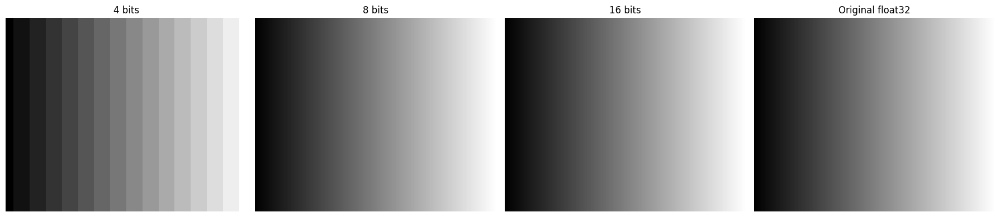

In [ ]:
# plot each img
fig, axes = plt.subplots(1, 4, figsize=(18, 4), sharex=True, sharey=True)
imgs =  [img_4, img_8, img_16, img_32]
labels = ['4 bits', '8 bits', '16 bits', 'Original float32', ]
for ax, image, title in zip(axes, imgs, labels):
    ax.imshow(image, cmap='gray', vmin=0, vmax=1, interpolation='nearest', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
# test TDV with each imgs (+ add noise)
sigma = 25

z_4 = add_gaussian_noise(img_4, sigma)
z_8 = add_gaussian_noise(img_8, sigma)
z_16 = add_gaussian_noise(img_16, sigma)
z_32 = add_gaussian_noise(img_32, sigma)

_, color = check_color(img)
vn, _ = load_model(color) 

# Add the grayscale channel for TDV, then return to 2D like the input.
x_4 = denoise_z(vn=vn, z=check_color(z_4)[0], sigma=sigma, scaled=True)
x_8 = denoise_z(vn=vn, z=check_color(z_8)[0], sigma=sigma, scaled=True)
x_16 = denoise_z(vn=vn, z=check_color(z_16)[0], sigma=sigma, scaled=True)
x_32 = denoise_z(vn=vn, z=check_color(z_32)[0], sigma=sigma, scaled=True)

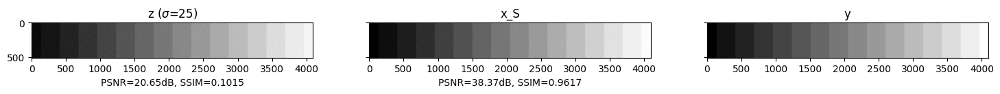

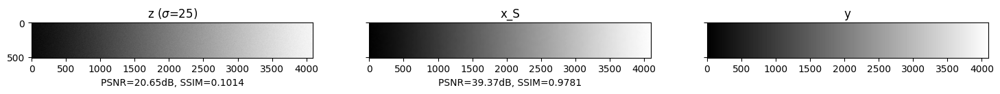

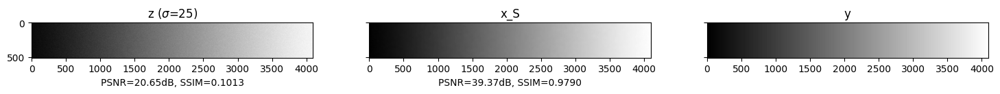

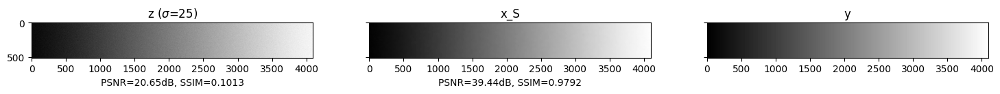

In [31]:
plot_results(z_4, x_4, img_4, sigma)
plot_results(z_8, x_8, img_8, sigma)
plot_results(z_16, x_16, img_16, sigma)
plot_results(z_32, x_32, img_32, sigma)

### Natural image

In [83]:
# Preserve the original HDR data (no uint8 conversion).
with OpenEXR.File("../data/StillLife.exr") as archivo:
    rgba = archivo.channels()["RGBA"].pixels
    img_hdr_natural = rgba[:, :, :3].astype(np.float32).copy()

print(img_hdr_natural.shape, img_hdr_natural.dtype)
print('HDR range:', img_hdr_natural.min(), img_hdr_natural.max())


(846, 1240, 3) float32
HDR range: 0.0 491.5


In [84]:
# Central 700x700 crop
crop_size_natural = 700
height_natural, width_natural = img_hdr_natural.shape[:2]
top_natural = (height_natural - crop_size_natural) // 2
left_natural = (width_natural - crop_size_natural) // 2
crop_hdr_natural = img_hdr_natural[top_natural:top_natural + crop_size_natural, left_natural:left_natural + crop_size_natural].copy()

# Use the SAME display transform as the original EXR preview.
positive_natural = np.maximum(crop_hdr_natural, 0)
img_natural = ((positive_natural / (1 + positive_natural)) ** (1 / 2.2)).astype(np.float32)

img_natural_4 = quantize_image(img_natural, 4)
img_natural_8 = quantize_image(img_natural, 8)
img_natural_16 = quantize_image(img_natural, 16)
img_natural_32 = img_natural.copy()
quantized_natural = {4: img_natural_4, 8: img_natural_8, 16: img_natural_16, 32: img_natural_32}

4 bits, values=16, max error=3.330e-02
8 bits, values=256, max error=1.959e-03
16 bits, values=14336, max error=7.629e-06
32 bits, values=14685, max error=0.000e+00


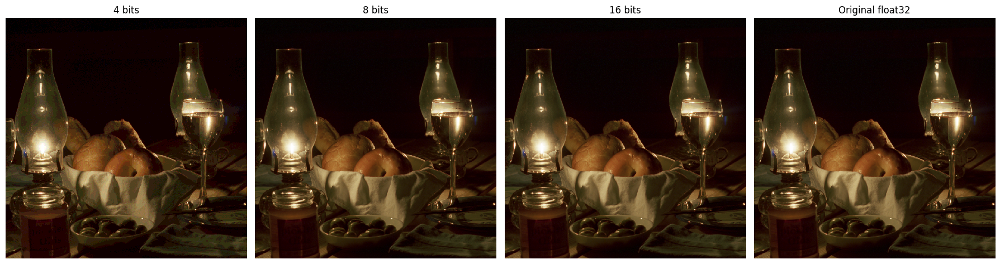

In [87]:
# plot the different quant's
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharex=True, sharey=True)
for ax, (bits, image) in zip(axes, quantized_natural.items()):
    error = np.abs(image.astype(np.float64) - img_natural_32.astype(np.float64))
    print(f'{bits} bits, values={np.unique(image).size}, max error={error.max():.3e}')
    ax.imshow(image, vmin=0, vmax=1, interpolation='nearest')
    ax.set_title(f'{bits} bits' if bits != 32 else 'Original float32')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [88]:
# Repeat the Gray ramp denoising experiment on the natural RGB image.
sigma_natural = 25
vn_natural, checkpoint_natural = load_model("color")
vn_natural.eval()

# Same noise realization at all bit depths
rng_natural = np.random.default_rng(0)
noise_natural = (sigma_natural / 255) * rng_natural.standard_normal(img_natural.shape).astype(np.float32)
results_natural = {}

for bits, image in quantized_natural.items():
    z_natural = np.clip(image + noise_natural, 0, 1)
    x_natural = denoise_z(vn=vn_natural, z=z_natural, sigma=sigma_natural, scaled=True)
    results_natural[bits] = {'z': z_natural, 'x': x_natural, 'y': image}


4 bits


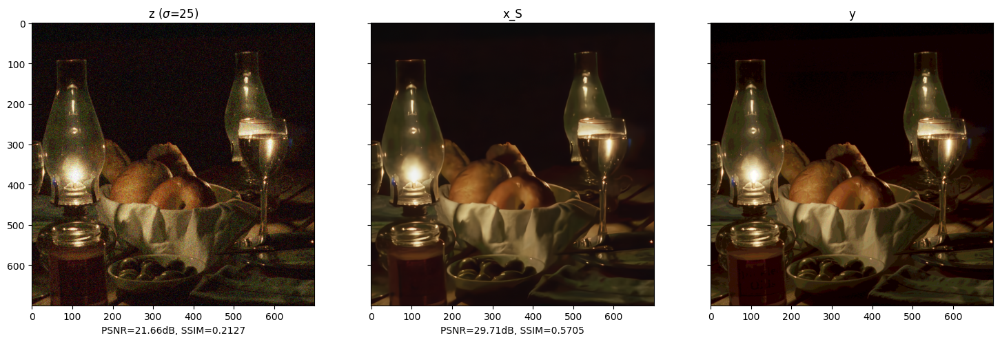

8 bits


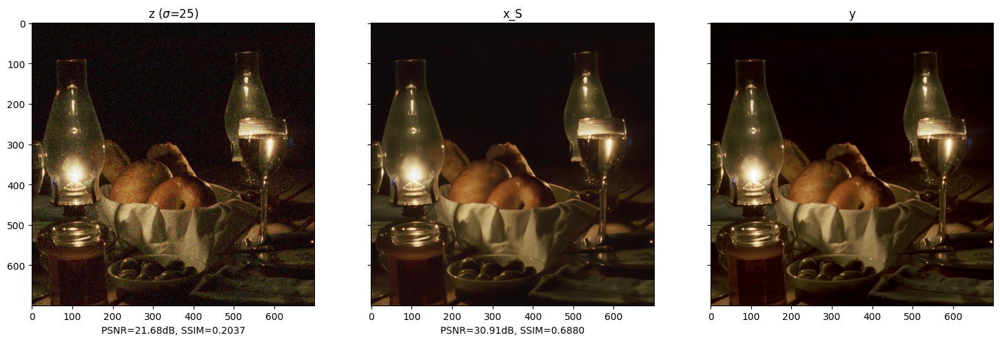

16 bits


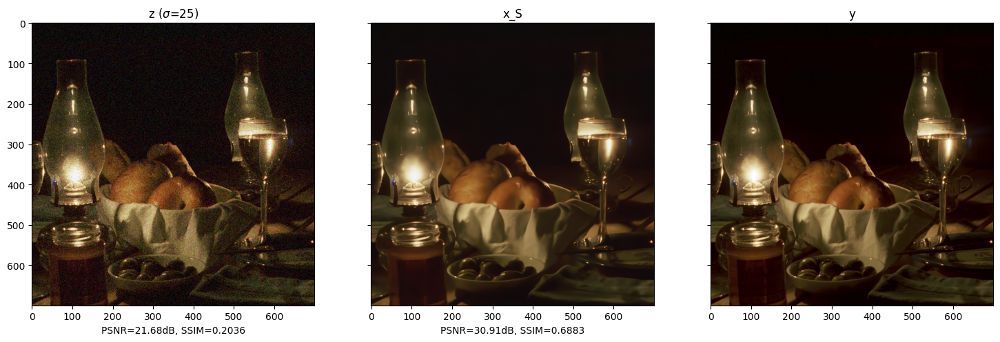

Original float32


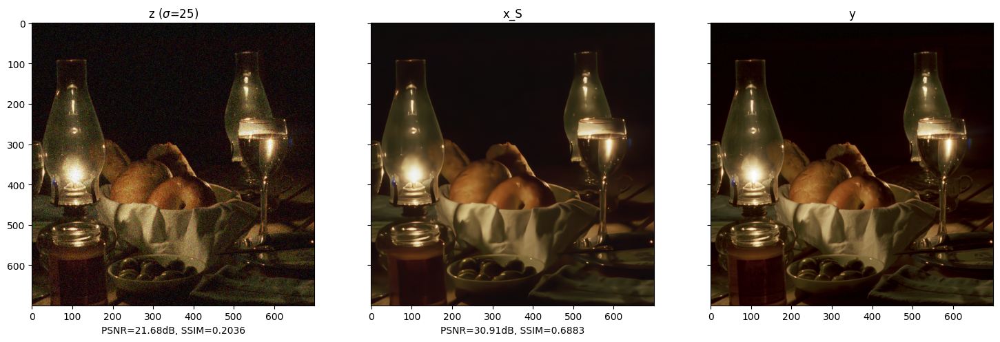

In [89]:
# Repeat the plot_results calls from Gray ramp
for bits, result in results_natural.items():
    print(f'{bits} bits' if bits != 32 else 'Original float32')
    plot_results(result['z'], result['x'], result['y'], sigma=sigma_natural, figsize=(18, 6))

## Clipping

In [77]:
# Independent setup for the clipping experiment
img_path_clip = os.path.join('..', 'data', 'water-castle.png')
img_clip = img_as_float(imageio.imread(img_path_clip)).astype(np.float32)
y_clip, color_clip = check_color(img_clip)


vn_clip, checkpoint_clip = load_model(color_clip)
vn_clip.eval()
sigma_clip = 25
z_clip_raw = add_gaussian_noise(y_clip, sigma_clip)
z_clip_bounded = np.clip(z_clip_raw, 0, 1)

In [ ]:
# run with and no clip
x_clip_raw_input = denoise_z(vn_clip, z_clip_raw, sigma=sigma_clip, scaled=False)
x_clip_bounded_input = denoise_z(vn_clip, z_clip_bounded, sigma=sigma_clip, scaled=False)

clipping_inputs = {'Input (noisy): no clipping': z_clip_raw, 'Input (noisy): clipping': z_clip_bounded}
clipping_outputs = {
    'Output: no clipping (Input: no clipping)': x_clip_raw_input, 'Output: clipping (Input: no clipping)': np.clip(x_clip_raw_input, 0, 1),
    'Output: no clipping (Input: clipping)': x_clip_bounded_input,'Output: clipping (Input: clipping)': np.clip(x_clip_bounded_input, 0, 1)
}

In [82]:
# Metrics before display stretching/clipping, always against the same reference
clipping_metrics = {}
for label, image in {**clipping_inputs, **clipping_outputs}.items():
    target = y_clip.squeeze()
    output = image.squeeze()
    clipping_metrics[label] = {
        'PSNR': psnr(output, target),
        'SSIM': ssim(output, target, data_range=1, channel_axis=-1 if target.ndim == 3 else None),
        'below_0_pct': 100 * np.mean(image < 0),
        'above_1_pct': 100 * np.mean(image > 1)
    }

print(f"{'Variant':48s} | {'PSNR dB':>8} | {'SSIM':>7} | {'<0 %':>7} | {'>1 %':>7}")
for label, scores in clipping_metrics.items():
    print(f"{label:48s} | {scores['PSNR']:8.3f} | {scores['SSIM']:7.4f} | "f"{scores['below_0_pct']:7.3f} | {scores['above_1_pct']:7.3f}")


Variant                                          |  PSNR dB |    SSIM |    <0 % |    >1 %
Input (noisy): no clipping                       |   20.163 |  0.3231 |   1.093 |   4.887
Input (noisy): clipping                          |   20.489 |  0.3358 |   0.000 |   0.000
Output: no clipping (Input: no clipping)         |   32.444 |  0.9048 |   0.000 |   2.056
Output: clipping (Input: no clipping)            |   32.456 |  0.9049 |   0.000 |   0.000
Output: no clipping (Input: clipping)            |   31.550 |  0.9021 |   0.000 |   0.002
Output: clipping (Input: clipping)               |   31.550 |  0.9021 |   0.000 |   0.000


## Color v/s gray 

In [32]:
def test_img_channels(vn, img, sigma, add_noise=True, noisy_img_path=None, n_bits = 8):
    max_value = 2**n_bits - 1
    sigma_ref = 25
    img = img.astype(np.float32) 
    
    if add_noise:
        y, img_color_type = check_color(img)
        z = y + sigma / max_value * np.random.randn(*y.shape).astype(np.float32)
    else:
        z, img_color_type = check_color(img)
        y = None # no ground truth img

    # apply vn (gray) to each channel of a rgb img
    x_S_channels = []
    num_channels = z.shape[2] 
    
    for c in range(num_channels):
        # one channel
        z_c = z[:, :, c:c+1]
        x_S_c = denoise_z(vn, z_c, sigma, sigma_ref)
        x_S_channels.append(x_S_c)

    # PLUS
    x_S = np.concatenate(x_S_channels, axis=2)

    return z, x_S, y

In [33]:
# Load color img with gray weights (apply channel by channel)
vn, checkpoint = load_model("gray")
img_path = os.path.join('..', 'data', 'water-castle.png')
img = imageio.imread(img_path).astype(np.float32) / 255
z_g, x_g, y_g = test_img_channels(vn, img, sigma= 25)

# compare to olor
vn, checkpoint = load_model("color")
z_c, x_c, y_c = test_img(vn, img, sigma= 25)

GRAY CHECKPOINT:


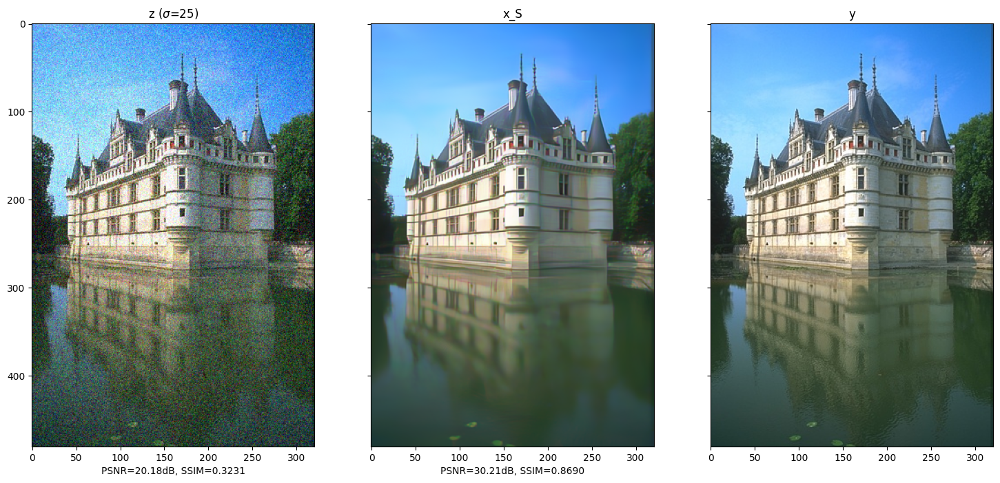

COLOR CHECKPOINT:


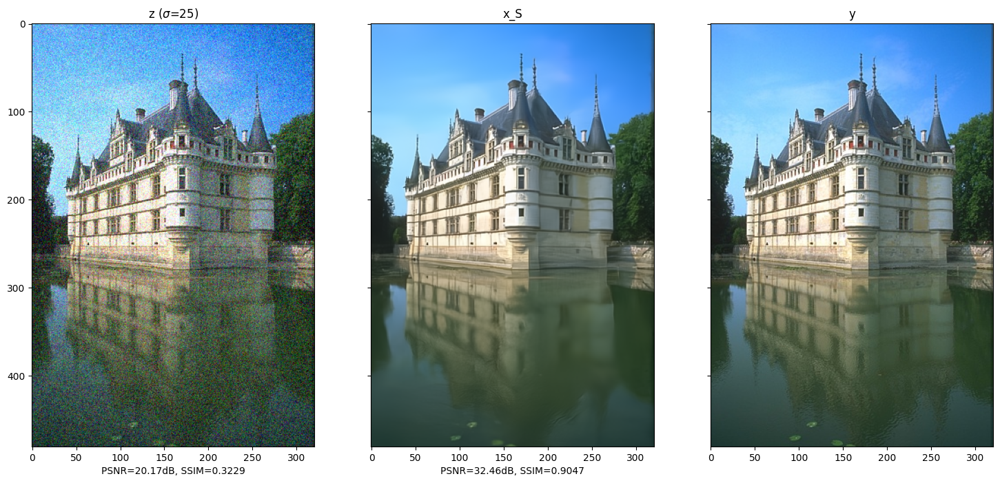

In [34]:
print("GRAY CHECKPOINT:")
plot_results(z_g, x_g, y_g, sigma = 25)
print("COLOR CHECKPOINT:")
plot_results(z_c, x_c, y_c, sigma = 25)

In [35]:
# test more noise
sigma = 50
vn, checkpoint = load_model("gray")
z_g, x_g, y_g = test_img_channels(vn, img, sigma= sigma)

vn, checkpoint = load_model("color")
z_c, x_c, y_c = test_img(vn, img, sigma= sigma)

GRAY CHECKPOINT:


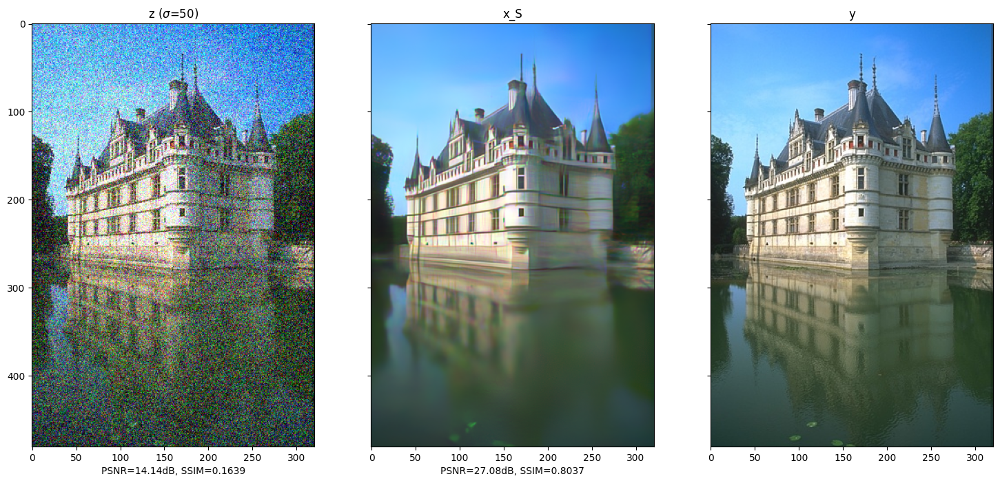

COLOR CHECKPOINT:


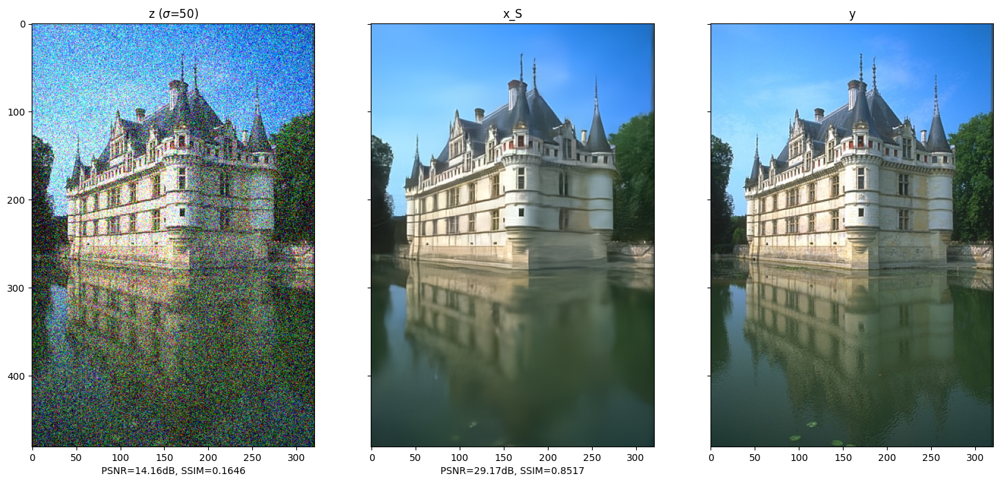

In [36]:
print("GRAY CHECKPOINT:")
plot_results(z_g, x_g, y_g, sigma)
print("COLOR CHECKPOINT:")
plot_results(z_c, x_c, y_c, sigma)